In [1]:
include("../init-notebook.jl")

include group.jl for user defined matrix generators
verify download of index files...
reading database


adding metadata...


adding svd data...
writing database


used remote sites are sparse.tamu.edu with MAT index and math.nist.gov with HTML index


(section-diffusion-stiffness)=
# Stiffness

In {numref}`section-diffusion-absstab` we analyzed time step constraints for the semidiscrete heat equation, $\mathbf{u}'=\mathbf{D}_{xx}\mathbf{u}$, in terms of stability regions and the eigenvalues $\lambda_j$ of the matrix. Since all the eigenvalues are negative and real, the one farthest from the origin, at about $-4/h^2$, determines the specific time step restriction. For an explicit method (or any method with a finite intersection with the negative real axis), the conclusion is $\tau=O(h^2)$. 

For the Euler and backward Euler solvers, stability is not the only cause of a severely limited time step. Both methods are first-order accurate, with truncation errors that are $O(\tau)$. Since the spatial discretization we chose is second-order accurate, then we should choose $\tau=O(h^2)$ for accuracy as well as stability. 

This calculus changes for second-order IVP solvers. When both time and space are discretized at second order, the total truncation error is $O(h^2+\tau^2)$, so it makes sense to use $\tau=O(h)$ for accuracy reasons alone. Therefore, a stability restriction of $\tau=O(h^2)$ is much more strict.

```{index} ! stiff differential equation
```
Problems for which the time step is dictated by stability rather than accuracy are referred to as **stiff**. Stiffness is not a binary condition but a spectrum. It can arise in nonlinear problems and in problems having nothing to do with diffusion. Except for the mildest instances of stiffness, an implicit time stepping method is the best choice.

## Linearization

Why should the model equation $y'=\lambda y$ of absolute stability have wide relevance? Through diagonalization, it is easily generalized to  $\mathbf{u}'=\mathbf{A} \mathbf{u}$ for a constant matrix $\mathbf{A}$. But that is still a severely limited type of problem.

Consider a general vector nonlinear system 

:::{math}
:label: stiffsystem
\mathbf{u}'=\mathbf{f}(t,\mathbf{u}).
:::

The key to making a connection with absolute stability is to look not at an exact solution but to *perturbations* of one. Such perturbations always exist in real numerical solutions, such as those due to roundoff error, for example. But if we assume the perturbations are tiny, then we can use linear approximations to describe their evolution. If we conclude from such an approximation that the perturbation may grow without bound, then we must seriously question the value of the numerical solution.

Let's introduce more precision into the discussion. Suppose that $\hat{\mathbf{u}}(t)$ is an exact solution that we wish to track, and that a perturbation has pushed us to a nearby solution curve $\hat{\mathbf{u}}(t) + \mathbf{v}(t)$. Substituting this solution into the governing ODE and appealing to a multidimensional Taylor series, we derive

:::{math}
[\hat{\mathbf{u}}(t) + \mathbf{v}(t)]' &= \mathbf{f}\bigl(t,\hat{\mathbf{u}}(t) + \mathbf{v}(t)\bigr) \\
\hat{\mathbf{u}}'(t) + \mathbf{v}'(t) &= \mathbf{f}\left(t, \hat{\mathbf{u}}(t)\right) + \mathbf{J}(t) \mathbf{v}(t) + O\bigl( \|\mathbf{v}(t)\|^2 \bigr).
:::

```{index} Jacobian matrix
```
We have introduced the Jacobian matrix $\mathbf{J}$, with entries

:::{math}
:label: ODEjacobian
J_{ij} = \frac{\partial f_i}{\partial u_j}(t,\hat{\mathbf{u}}(t)).
:::

By dropping the higher-order terms, which are negligible at least initially, we derive a linear ODE for the evolution of the perturbation. 

```{index} ! linearization of an ODE
```

(definition-stiffness-linearization)=
::::{proof:definition} Linearization of an ODE
A **linearization** of system {eq}`stiffsystem` at an exact solution $\hat{\mathbf{u}}(t)$ is

:::{math}
:label: ODElinearization
\mathbf{v}'(t) = \mathbf{J}(t) \mathbf{v}(t),
:::

where $\mathbf{v}(t)$ is a perturbation to the exact solution, and $\mathbf{J}$ is the Jacobian matrix {eq}`ODEjacobian`.
::::

```{index} Oregonator
```
(example-stiffness-oregon)=
::::{proof:example}
The **Oregonator** is a well-known ODE system modeling a chemical oscillator and is given by
  
:::{math}
:label: oregonator
\begin{split}
u_1'  & = s[u_2(1-u_1) + u_1(1-q u_1)] \\
u_2'  & = s^{-1}(u_3-u_2-u_1u_2)      \\
u_3'  & = w(u_1-u_3),
\end{split}
:::

where $s$, $q$, and $w$ are constants. Linearization about an exact (albeit unknown) solution $\hat{\mathbf{u}}(t)$ leads to the Jacobian

:::{math}
:label: oregonator-jac
\mathbf{J} (t) =
\begin{bmatrix}
  s(1 -\hat{u}_2 - 2q\hat{u}_1) & s(1-\hat{u}_1)  & 0             \\
  -\hat{u}_2/s          & -(1+\hat{u}_1)/s & 1/s           \\
  w                  & 0             & -w
\end{bmatrix}.
:::
::::

## Freezing time

While {eq}`ODElinearization` is linear, the Jacobian matrix in it is time-dependent, which makes analysis difficult. If a perturbation is introduced at a moment $t=t_\star$, we freeze the Jacobian there and consider

:::{math}
\mathbf{v}'=\mathbf{A}\mathbf{v}, \quad \mathbf{A}=\mathbf{J}(t_\star).
:::

This equation is of the type we used in {numref}`section-diffusion-absstab` to discuss the absolute stability of IVP solvers. This suggests the following.

:::{proof:observation} Rule of thumb for absolute stability
The eigenvalues of the Jacobian appearing in the linearization about an exact solution, after scaling by the time step $\tau$, must lie in the stability region of the IVP solver.
:::

We have not stated a theorem here, because we made several approximations and assumptions along the way that are not trivial to quantify. Nevertheless, if the rule of thumb is violated, we should expect perturbations to the exact solution to grow significantly with time, eventually rendering the numerical solution useless. Note that roundoff error is constantly introducing perturbations, so the rule of thumb applies along the entire trajectory of the numerical solution.

(demo-stiffness-oregon)=
:::{proof:demo}
:::

```{raw} html
<div class='demo'>
```

```{raw} latex
%%start demo%%
```

In {numref}`Example {number} <example-stiffness-oregon>` we derived a Jacobian matrix for the Oregonator model. Here is a numerical solution of the ODE.

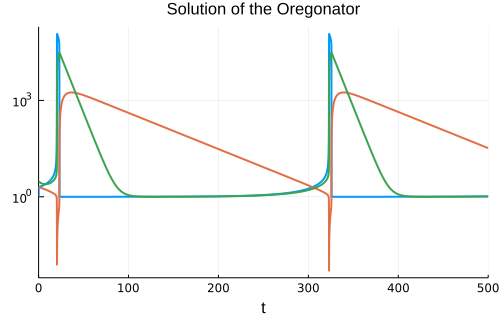

In [2]:
function ode(u,p,t)
    s,w,q = p
    f = [ 
        s*(u[2]*(1-u[1]) + u[1]*(1-q*u[1])),
        (u[3]-u[2]-u[1]*u[2]) /s,   
        w*(u[1]-u[3])
        ]
    return f
end

s,w,q = 77.27,.161,8.375e-6
oregon = ODEProblem(ode,[1.,2,3],(0.,500.),[s,w,q])
sol = solve(oregon)
plot(sol,yscale=:log10,legend=:none,
    title="Solution of the Oregonator")

At each value of the numerical solution, we can compute the eigenvalues of the Jacobian. Here we plot all of those eigenvalues in the complex plane.

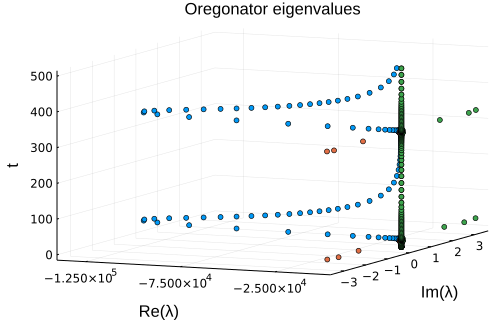

In [3]:
t,u = sol.t[1:2:end],sol.u[1:2:end]
λ = fill(0.0im,length(t),3)
for (k,u) in enumerate(u)
    J = [
    s*(1-u[2]-2q*u[1]) s*(1-u[1])        0 
         -u[2]/s       -(1+u[1])/s     1/s 
            w               0           -w
        ]
    λ[k,:] .= eigvals(J)
end

scatter(real(λ),imag(λ),t,
    xaxis=("Re(λ)",25000*(-5:2:-1)),ylabel="Im(λ)",zlabel="t",
    title="Oregonator eigenvalues")

You can see that there is one eigenvalue that ranges over a wide portion of the negative real axis and dominates stability considerations.

```{raw} html
</div>
```

```{raw} latex
%%end demo%%
```

## Multiple time scales

The solution to $y' = \lambda y$, $y(0)=1$ is $\exp(\lambda t)$. If $\lambda$ is real, this solution grows or decays by a factor of $e$ $t=1/|\lambda|$. If $\lambda = i\omega$ is imaginary, then the solution has sines and cosines of frequency $\omega$. A complex $\lambda$ combines these effects.

::::{proof:observation}
We may regard $|\lambda|^{-1}$, which has units of time, as a characteristic time scale of dynamics due to eigenvalue $\lambda$.
:::: 

A Jacobian matrix with eigenvalues at different orders of magnitude therefore implies multiple time scales that the IVP solver needs to cope with. Say $|\lambda_1|\gg |\lambda_2|$. Any explicit integrator will have a bounded stability region and therefore impose a time step restriction proportional to $|\lambda_1|^{-1}$. Any good adaptive integrator will obey such a restriction naturally to control the error. But to observe the "slow" part of the solution, the simulation must go on for a time on the order of $|\lambda_2|^{-1}$, which is much longer.

In {numref}`Demo {number} <demo-stiffness-oregon>`, for example, you can see a combination of fast changes and slow evolution. 

(demo-stiffness-explicit)=
```{proof:demo}
```

```{raw} html
<div class='demo'>
```

```{raw} latex
%%start demo%%
```

The `Rodas4P` solver is good for stiff problems, and needs few time steps to solve the Oregonator from {numref}`Demo {number} <demo-stiffness-oregon>`.

In [4]:
oregon = remake(oregon,tspan=(0.,25.))
sol = solve(oregon,Rodas4P())
println("Number of time steps for Rodas4P: $(length(sol.t)-1)")

Number of time steps for Rodas4P: 127


But if we apply {numref}`Function {number} <function-rk23>` to the problem, the step size will be made small enough to cope with the large negative eigenvalue.

In [5]:
t,u = FNC.rk23(oregon,1e-4)
println("Number of time steps for RK23: $(length(t)-1)")

Number of time steps for RK23: 20773


Starting from the eigenvalues of the Jacobian matrix, we can find an effective $\zeta(t)$ by multiplying with the local time step size.

In [6]:
λ = fill(1.0im,length(t),3)
for (i,u) in enumerate(u)
    J = [
    s*(1-u[2]-2q*u[1]) s*(1-u[1])        0 
         -u[2]/s       -(1+u[1])/s     1/s 
            w               0           -w
        ]
    λ[i,:] .= eigvals(J)
end

ζ = diff(t).*λ[1:end-1,:]
scatter(real(ζ),imag(ζ),m=2,
    xlabel="Re(ζ)",ylabel="Im(ζ)",
    title="Oregonator stability")

Roughly speaking, the $\zeta$ values stay within or close to the RK2 stability region in {numref}`figure-stabreg_bd_rk`. Momentary departures from the region are possible, but time stepping repeatedly in that situation would cause instability. 
```{raw} html
</div>
```

```{raw} latex
%%end demo%%
```

## A-stability

In general, the larger the stability region, the more generous the stability time step restriction will be. In the specific context of a semidiscretization of the heat equation, we observed that the eigenvalues of the Jacobian reached a distance $O(h^{-2})$ on the negative real axis. Consequently, any stability region that is bounded in the negative real direction will have a $\tau=O(h^2)$ restriction; only the leading constant will change.

Hence it is desirable in stiff problems generally, and diffusion problems in particular, to have a stability region that is unbounded in at least the negative real direction.

```{index} ! A-stability and A(α)-stability
```

::::{proof:definition} A($\alpha$)- and A-stability
A stability region that includes a sector of angle $\alpha$ in either direction from the negative real axis is called **A($\alpha$)-stable**. A time stepping method whose stability region contains the entire left half-plane is called **A-stable**.
::::

For the heat equation, A($\alpha$)-stability for any $\alpha>0$ suffices for unconditional stability. 

An A-stable method has a stability region that includes all eigenvalues having nonpositive real part. In other words, all perturbations which ought to be bounded in time actually are. When an A-stable method is used, time step size can be based on accuracy considerations alone.

```{index} trapezoid formula; for an IVP
```

Referring to {numref}`figure-stabreg_ab_am` and {numref}`figure-stabreg_bd_rk`, the backward Euler (AM1) and trapezoid (AM2) formulas are the only A-stable methods we have encountered. In fact, more accurate A-stable methods are not easy to come by.

```{index} Dahlquist theorems
```
::::{proof:theorem} Second Dahlquist stability barrier
An A-stable linear multistep method must be implicit and have order of accuracy no greater than 2.
::::

Hence the trapezoid formula is as accurate as we can hope for in the family of A-stable linear multistep methods. The situation with Runge–Kutta methods is a little different, but not a great deal more favorable; we do not go into the details.

## Exercises

1. ✍ Write the mechanical oscillator $x''+cx'+kx=0$ as a first-order linear system, $\mathbf{u}'=\mathbf{A}\mathbf{u}$. Show that if $c=k+1$, this system is stiff as $k\to\infty$.

2. This exercise is about the IVP $u'=\cos(t) - 200(u-\sin(t))$, $u(0)=0$.

    **(a)** ✍ Show that $u(t) = \sin(t)$ is the exact solution, and find the linearization about this solution.

    **(b)** ✍ Find the lone eigenvalue of the Jacobian. What other time scale is also relevant in the solution?

    **(c)** ⌨ Use {numref}`Function {number} <function-ab4>` (`ab4`) to solve the IVP over $t\in[0,\pi/2]$ with $n=800,850,900,\ldots,1200$ steps. By comparing to the exact solution, show that the method gets either no accurate digits or at least 11 accurate digits.

3. In {numref}`Example %s <example-systems-coupledpendula>` we derived the following system for two pendulums hanging from a rod:
      
    \begin{align*}
      u_1' &= u_3 \\
      u_2' &= u_4 \\
      u_3' &= -\gamma u_3 - \frac{g}{L}\sin u_1 + k(u_2-u_1) \\
      u_4' &= -\gamma u_4 - \frac{g}{L}\sin u_2 + k(u_1-u_2).
    \end{align*}
    
    **(a)** ✍ Use the approximation $\sin x \approx x$ to write the problem as a linear system.

    **(b)** ⌨ Compute the eigenvalues of the linear system with $\gamma=0.1$, $g/L=1$, and $k=10^d$ for $d=0,1,\ldots,5$. How fast does the ratio of largest to smallest eigenvalue (in magnitude) grow, as a function of $k$?

4. The equation $u'=u^2-u^3$ is a simple model for combustion of a flame ball in microgravity. (This problem is adapted from section 7.9 of {cite}`molerNumericalComputing2010`.) After "ignition," the exact solution rapidly approaches 1.

    **(a)** ⌨ Solve the problem with initial condition $u(0) =0.001$ for $0\le t \le 2000$, using {numref}`Function {number} <function-rk4>` with $n=2000$ steps. Plot the solution.

    **(b)** ✍ Find the $1\times 1$ Jacobian of this system, and use it with {numref}`figure-stabreg_bd_rk` to derive an upper bound on the time step of RK4 when $u=1$.
    
    **(c)** ⌨ Repeat part (a) with $n=200,300,\ldots,1000$, and make a table of the error at the final time, assuming the exact solution is 1. How do the results relate to part (b)? 

    ```{index} van der Pol equation
    ```
5. The *van der Pol equation* is a famous nonlinear oscillator given by
  
    :::{math}
      :label: vanderpol
      y'' - \mu(1-y^2)y' + y = 0,
    :::

    where $\mu\ge 1$ is a constant.

    **(a)** ✍ Write the equation as a first-order system and find its Jacobian.

    **(b)** ✍ Find the eigenvalues of the Jacobian when $y=\pm 2$ and $y'=0$.

    **(c)** ⌨ Solve the problem `solve` with $\mu=500$, $y(0) = y'(0) = 1$, for $0\le t \le 2000$. Plot $y(t)$ as a function of $t$.

    **(d)** ⌨ Define $M(t)$ as the minimum (i. e., most negative) real part of the eigenvalues of the Jacobian using the computed solution at time $t$. Evaluate $M$ for each $t=0,2,4,6,\ldots,2000$, and plot $M(t)$. Explain how your plot relates to parts (b) and (c).